In [1]:
import funcs
import mrsobs

import numpy as np
from astropy.io import fits
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
plt.style.use('presentation')
%matplotlib notebook

import warnings
warnings.simplefilter('ignore')

In [2]:
workDir  = '/Users/ioannisa/Desktop/python/miri_devel/'
lvl1path = '/Volumes/miri_mrs_data/FM_MRS/'
lvl2path = workDir+'FM_data/LVL2/'
cdpDir   = workDir+'cdp_data/'

In [3]:
# Get data
band     = '1A'
ext_source_sci,ext_source_bkg = mrsobs.FM_MTS_BB_extended_source(lvl2path,band,bb_temp='800K')
ext_source_bkgsubtr = ext_source_sci-ext_source_bkg

ext_source_hdu  = fits.open(lvl1path+'FM1T00011284/MIRFM1T00011284_1_495_SE_2011-05-31T04h09m25.fits') # band 1A
ext_source_ramp = (ext_source_hdu[0].data).astype('float')

bkg_exp_hdu = fits.open(lvl1path+'FM1T00011285/MIRFM1T00011285_1_495_SE_2011-05-31T05h06m47.fits') # band 1A
bkg_exp_ramp = (bkg_exp_hdu[0].data).astype('float')

sci_ramp = ext_source_ramp-bkg_exp_ramp # this is not how the background should be subtracted, this should be done at the MRS data lvl2 (find a dark patch of sky in the FOV to subtract)

# load new slice map
sliceMaps_hdu = fits.open(cdpDir+'CDP7/MIRI_FM_MIRIFUSHORT_12SHORT_DISTORTION_7B.05.00.fits')['Slice_Number']
sliceMaps = fits.open(cdpDir+'CDP7/MIRI_FM_MIRIFUSHORT_12SHORT_DISTORTION_7B.05.00.fits')['Slice_Number'].data

In [4]:
print(repr(ext_source_hdu[0].header))

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                   16 / array data type                                
NAXIS   =                    3 / number of array dimensions                     
NAXIS1  =                 1032                                                  
NAXIS2  =                 1280                                                  
NAXIS3  =                  120 / length of third data axis                      
EXTEND  =                    T                                                  
                                                                                
                                                                                
                                                                                
DATE    = '2011-05-31T04:09:33' / date file created (yyyy-mm-ddThh:mm:ss,UTC)   
BSCALE  =                    1 / scale factor for array value to physical value 
BZERO   =                327

In [5]:
nints = ext_source_hdu[0].header['NINT']
ngroups = ext_source_hdu[0].header['NGROUP']
frame_delta_time = ext_source_hdu[0].header['TFRAME']
print ext_source_ramp.shape

(120, 1280, 1032)


<IPython.core.display.Javascript object>


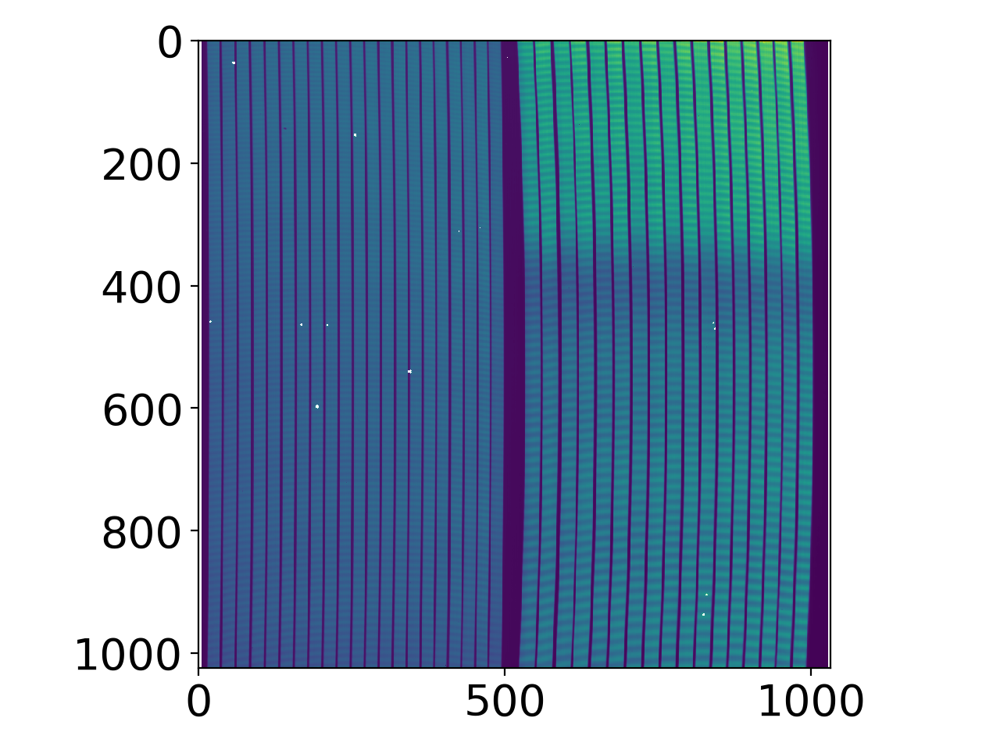

In [6]:
plt.figure()
plt.imshow(ext_source_bkgsubtr)
plt.tight_layout()

<IPython.core.display.Javascript object>


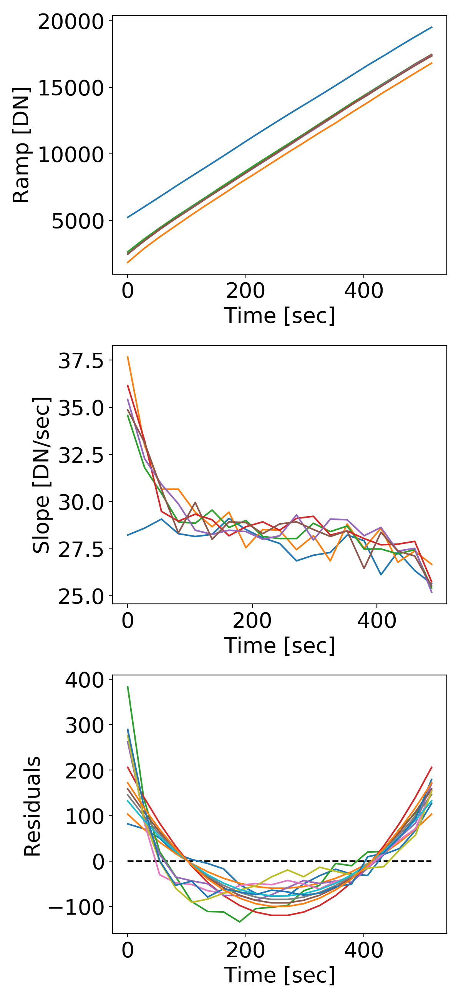

Determined slope: 28.67 DN/sec
DHAS-estimated slope: 26.97 DN/sec


In [7]:
ypos,xpos = 177,27
fig,axs = plt.subplots(3,1,figsize=(6,13))
for i in range(nints):
    xdata  = np.arange(ext_source_ramp.shape[0]/nints)*frame_delta_time
    ydata  = ext_source_ramp[i*ngroups:(i+1)*ngroups,ypos,xpos]
    n_poly = 1
    
    popt = np.polyfit(xdata,ydata,n_poly) # ,w=1/sigma
    poly = np.poly1d(popt)
    
    residuals = poly(xdata)-ydata
    
    popt2 = np.polyfit(xdata,residuals,n_poly+1) # ,w=1/sigma
    poly2 = np.poly1d(popt2)

#     axs[0].plot(xdata,poly(xdata))
    axs[0].plot(xdata,ydata)
#     axs[0].plot(xdata,ydata,'o')
    axs[0].set_xlabel('Time [sec]')
    axs[0].set_ylabel('Ramp [DN]')
    axs[0].legend(loc='upper left')
#     axs[1].plot(xdata[:-1],np.diff(ydata)/frame_delta_time)
    axs[1].plot(xdata[:-1],np.diff(ydata)/frame_delta_time)
    axs[1].set_xlabel('Time [sec]')
    axs[1].set_ylabel('Slope [DN/sec]')
    axs[2].plot(xdata,residuals)
    axs[2].plot(xdata,poly2(xdata))
    axs[2].set_xlabel('Time [sec]')
    axs[2].set_ylabel('Residuals')
    axs[2].legend(loc='upper center')
axs[2].hlines(0,0,xdata[-1],linestyle='dashed')
plt.tight_layout()

print 'Determined slope: {} DN/sec'.format(round(popt[0],2))
print 'DHAS-estimated slope: {} DN/sec'.format(round(ext_source_bkgsubtr[ypos,xpos],2))

<IPython.core.display.Javascript object>


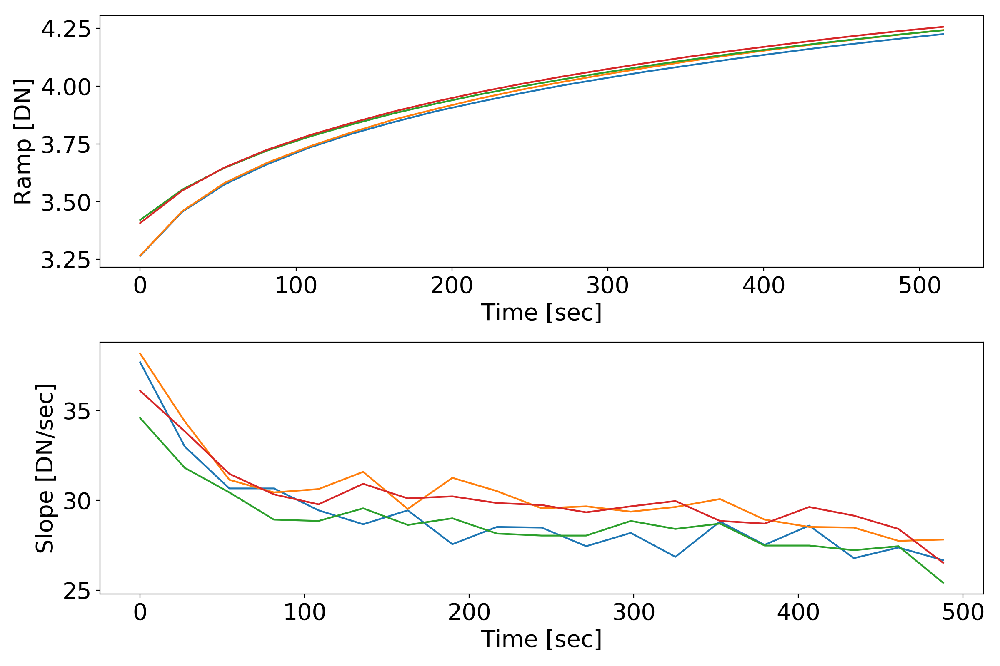

Determined slope: 28.67 DN/sec
DHAS-estimated slope: 26.97 DN/sec
DHAS-estimated slope: 28.2 DN/sec


In [8]:
ypos,xpos = 177,27
fig,axs = plt.subplots(2,1,figsize=(12,8))
for i in [1,2]:
    xdata  = np.arange(ext_source_ramp.shape[0]/nints)*frame_delta_time
    ydata  = ext_source_ramp[i*ngroups:(i+1)*ngroups,ypos,xpos]
    ydata2  = ext_source_ramp[i*ngroups:(i+1)*ngroups,ypos+2,xpos]
    
    axs[0].plot(xdata,np.log10(ydata))
    axs[0].plot(xdata,np.log10(ydata2))
    axs[0].set_xlabel('Time [sec]')
    axs[0].set_ylabel('Ramp [DN]')
    axs[0].legend(loc='upper left')
    axs[1].plot(xdata[:-1],np.diff(ydata)/frame_delta_time)
    axs[1].plot(xdata[:-1],np.diff(ydata2)/frame_delta_time)
    axs[1].set_xlabel('Time [sec]')
    axs[1].set_ylabel('Slope [DN/sec]')
plt.tight_layout()

print 'Determined slope: {} DN/sec'.format(round(popt[0],2))
print 'DHAS-estimated slope: {} DN/sec'.format(round(ext_source_bkgsubtr[ypos,xpos],2))
print 'DHAS-estimated slope: {} DN/sec'.format(round(ext_source_bkgsubtr[ypos+2,xpos],2))

<IPython.core.display.Javascript object>


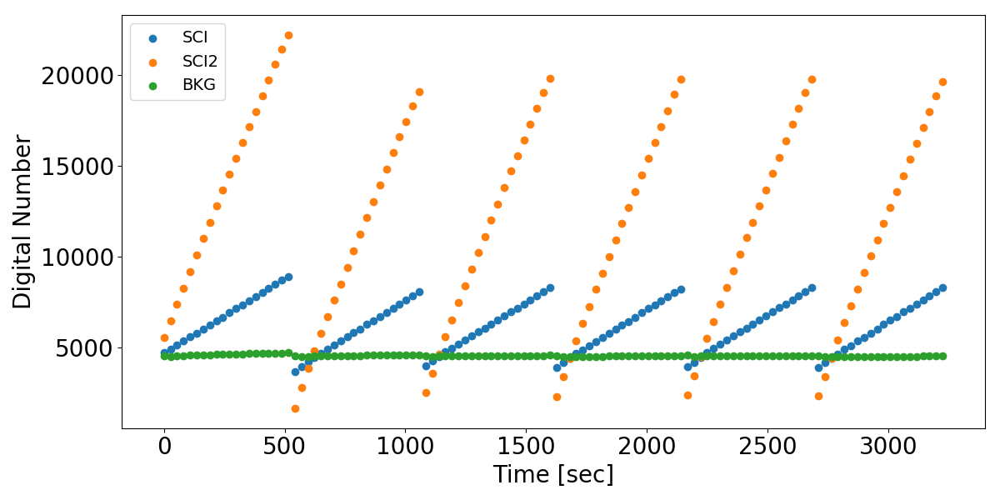

<IPython.core.display.Javascript object>


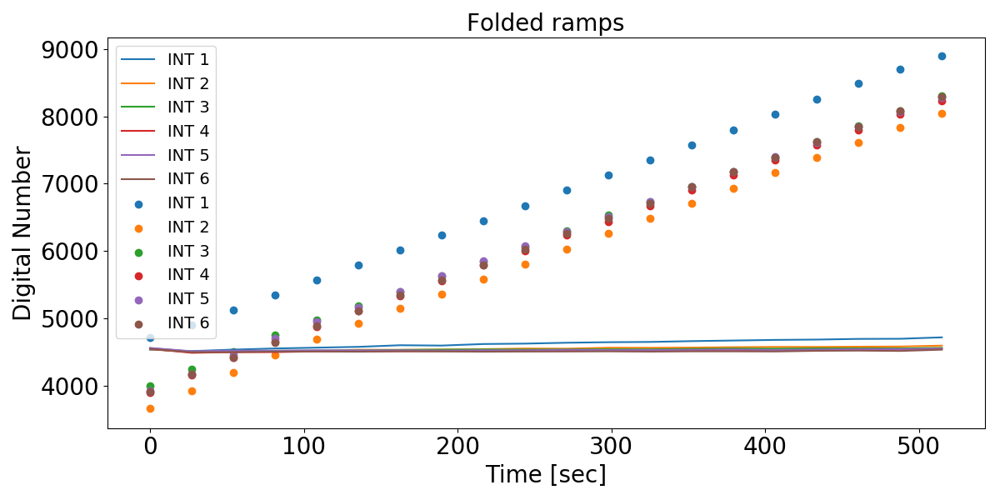

In [6]:
plt.figure(figsize=(12,6))
plt.scatter(np.arange(ext_source_ramp.shape[0])*frame_delta_time,ext_source_ramp[:,27,177],label='SCI')
plt.scatter(np.arange(ext_source_ramp.shape[0])*frame_delta_time,ext_source_ramp[:,27,277],label='SCI2')
plt.scatter(np.arange(bkg_exp_ramp.shape[0])*frame_delta_time,bkg_exp_ramp[:,27,177],label='BKG')
plt.xlabel('Time [sec]')
plt.ylabel('Digital Number')
plt.legend(loc='upper left')
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.title('Folded ramps')
for i in range(nints):
    plt.scatter(np.arange(ext_source_ramp.shape[0]/nints)*frame_delta_time,ext_source_ramp[i*ngroups:(i+1)*ngroups,27,177],label='INT {}'.format(i+1))
    plt.plot(np.arange(bkg_exp_ramp.shape[0]/nints)*frame_delta_time,bkg_exp_ramp[i*ngroups:(i+1)*ngroups,27,177],label='INT {}'.format(i+1))
plt.legend(loc='upper left')
plt.xlabel('Time [sec]')
plt.ylabel('Digital Number')
plt.tight_layout() 

<IPython.core.display.Javascript object>


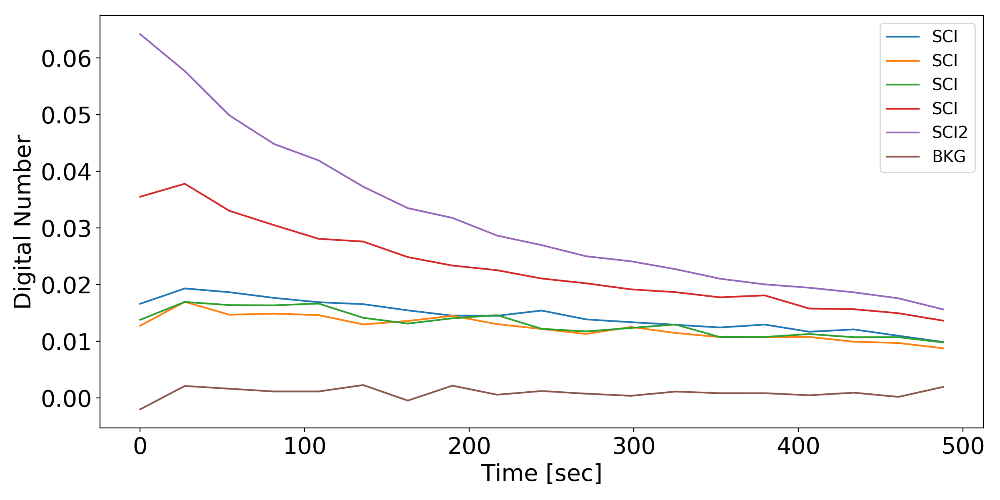

<IPython.core.display.Javascript object>


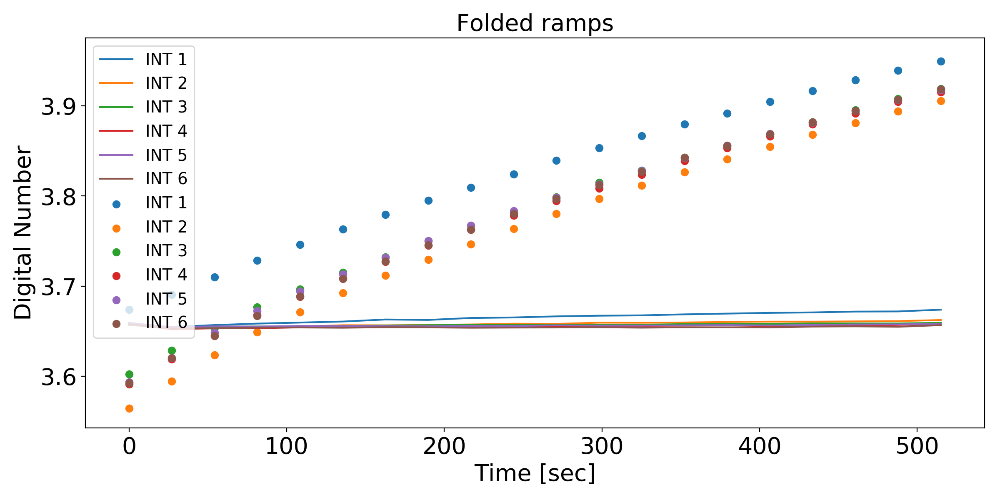

<IPython.core.display.Javascript object>


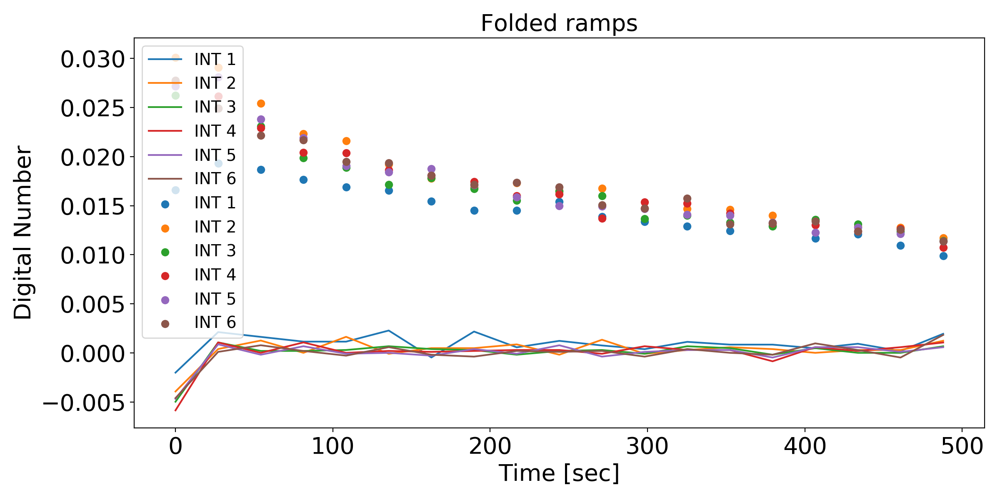

In [12]:
plt.figure(figsize=(12,6))
plt.plot(np.arange(20)[:-1]*frame_delta_time,np.diff(np.log10(ext_source_ramp[:20,27,177])),label='SCI')
plt.plot(np.arange(20)[:-1]*frame_delta_time,np.diff(np.log10(ext_source_ramp[:20,27,178])),label='SCI')
plt.plot(np.arange(20)[:-1]*frame_delta_time,np.diff(np.log10(ext_source_ramp[:20,27,179])),label='SCI')
plt.plot(np.arange(20)[:-1]*frame_delta_time,np.diff(np.log10(ext_source_ramp[:20,27,180])),label='SCI')
plt.plot(np.arange(20)[:-1]*frame_delta_time,np.diff(np.log10(ext_source_ramp[:20,27,277])),label='SCI2')
plt.plot(np.arange(20)[:-1]*frame_delta_time,np.diff(np.log10(bkg_exp_ramp[:20,27,177])),label='BKG')
plt.xlabel('Time [sec]')
plt.ylabel('Digital Number')
plt.legend(loc='upper right')
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.title('Folded ramps')
for i in range(nints):
    plt.scatter(np.arange(ext_source_ramp.shape[0]/nints)*frame_delta_time,np.log10(ext_source_ramp[i*ngroups:(i+1)*ngroups,27,177]),label='INT {}'.format(i+1))
    plt.plot(np.arange(bkg_exp_ramp.shape[0]/nints)*frame_delta_time,np.log10(bkg_exp_ramp[i*ngroups:(i+1)*ngroups,27,177]),label='INT {}'.format(i+1))
plt.legend(loc='upper left')
plt.xlabel('Time [sec]')
plt.ylabel('Digital Number')
plt.tight_layout() 

plt.figure(figsize=(12,6))
plt.title('Folded ramps')
for i in range(nints):
    plt.scatter(np.arange(ext_source_ramp.shape[0]/nints)[:-1]*frame_delta_time,np.diff(np.log10(ext_source_ramp[i*ngroups:(i+1)*ngroups,27,177])),label='INT {}'.format(i+1))
    plt.plot(np.arange(bkg_exp_ramp.shape[0]/nints)[:-1]*frame_delta_time,np.diff(np.log10(bkg_exp_ramp[i*ngroups:(i+1)*ngroups,27,177])),label='INT {}'.format(i+1))
plt.legend(loc='upper left')
plt.xlabel('Time [sec]')
plt.ylabel('Digital Number')
plt.tight_layout() 

<IPython.core.display.Javascript object>


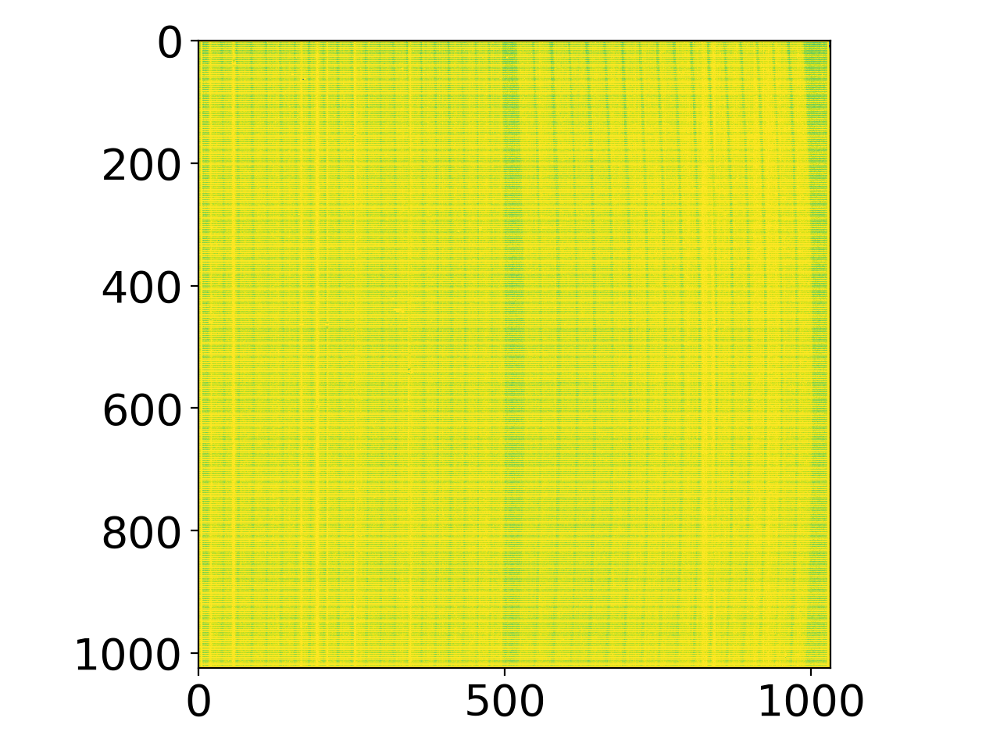

<IPython.core.display.Javascript object>


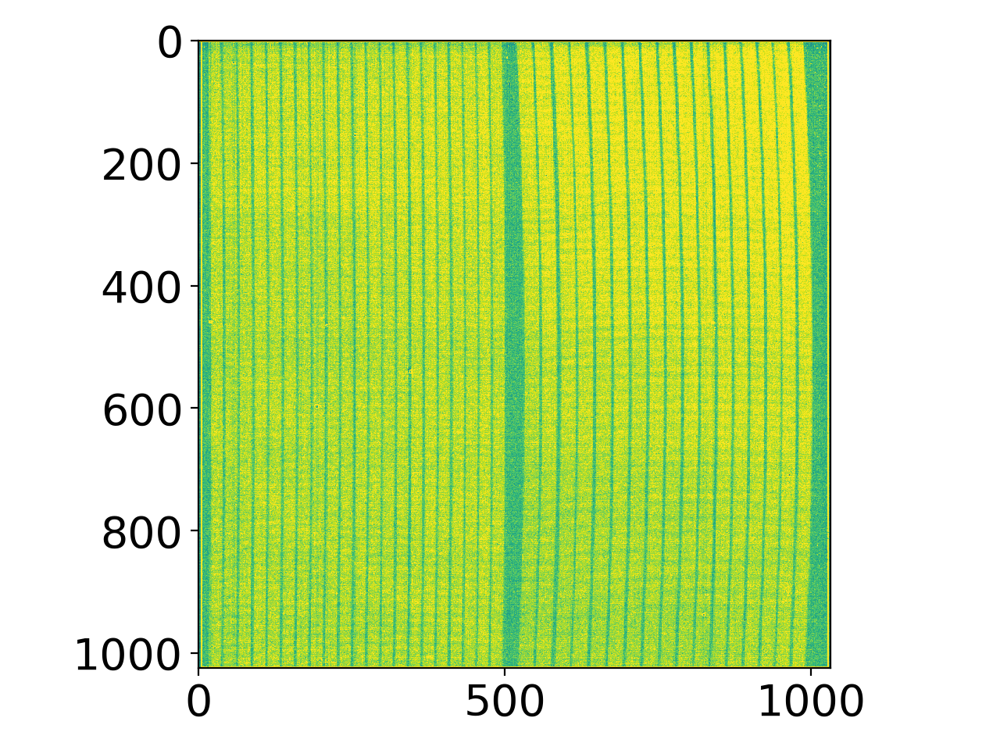

<IPython.core.display.Javascript object>


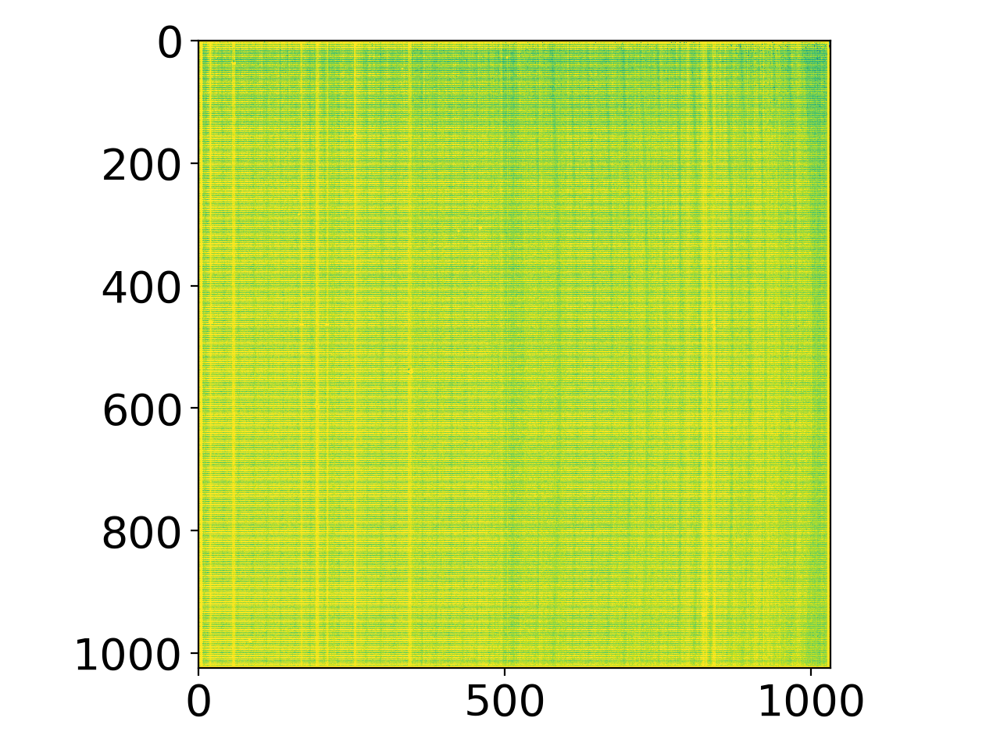

In [56]:
plt.figure()
plt.imshow(bkg_exp_ramp[1,:1024,:]-bkg_exp_ramp[0,:1024,:],vmax=10)
# plt.imshow(sliceMaps[-2],alpha=0.2)
plt.tight_layout()

plt.figure()
plt.imshow(bkg_exp_ramp[2,:1024,:]-bkg_exp_ramp[1,:1024,:],vmax=30)
# plt.imshow(sliceMaps[-2],alpha=0.2)
plt.tight_layout()

plt.figure()
plt.imshow(bkg_exp_ramp[21,:1024,:]-bkg_exp_ramp[20,:1024,:],vmax=10)
# plt.imshow(sliceMaps[-2],alpha=0.2)
plt.tight_layout()

### GROUP 1 - GROUP 0 (detector left to right, all features)

In [57]:
img1 = bkg_exp_ramp[1,:,:258]-bkg_exp_ramp[0,:,:258]
img2 = bkg_exp_ramp[1,:,258:516]-bkg_exp_ramp[0,:,258:516]
img3 = bkg_exp_ramp[1,:,516:774]-bkg_exp_ramp[0,:,516:774]
img4 = bkg_exp_ramp[1,:,774:]-bkg_exp_ramp[0,:,774:]

# histograms
upper_lim = 60.
# even rows
arr1_even = img1[::2].flatten().copy()
arr2_even = img2[::2].flatten().copy()
arr3_even = img3[::2].flatten().copy()
arr4_even = img4[::2].flatten().copy()

arr1_even_hist,binEdges = np.histogram(arr1_even[(arr1_even<upper_lim)],bins=1000,normed=True); arr1_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr2_even_hist,binEdges = np.histogram(arr2_even[(arr2_even<upper_lim)],bins=1000,normed=True); arr2_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr3_even_hist,binEdges = np.histogram(arr3_even[(arr3_even<upper_lim)],bins=1000,normed=True); arr3_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr4_even_hist,binEdges = np.histogram(arr4_even[(arr4_even<upper_lim)],bins=1000,normed=True); arr4_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])

# odd rows
arr1_odd  = img1[1::2].flatten().copy()
arr2_odd  = img2[1::2].flatten().copy()
arr3_odd  = img3[1::2].flatten().copy()
arr4_odd  = img4[1::2].flatten().copy()

arr1_odd_hist,binEdges = np.histogram(arr1_odd[(arr1_odd<upper_lim)],bins=1000,normed=True); arr1_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr2_odd_hist,binEdges = np.histogram(arr2_odd[(arr2_odd<upper_lim)],bins=1000,normed=True); arr2_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr3_odd_hist,binEdges = np.histogram(arr3_odd[(arr3_odd<upper_lim)],bins=1000,normed=True); arr3_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr4_odd_hist,binEdges = np.histogram(arr4_odd[(arr4_odd<upper_lim)],bins=1000,normed=True); arr4_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])

<IPython.core.display.Javascript object>


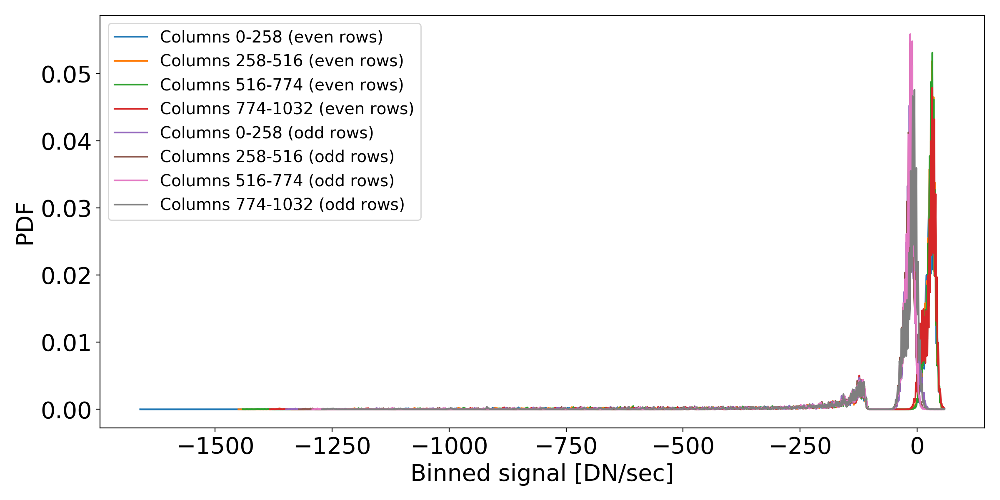

<IPython.core.display.Javascript object>


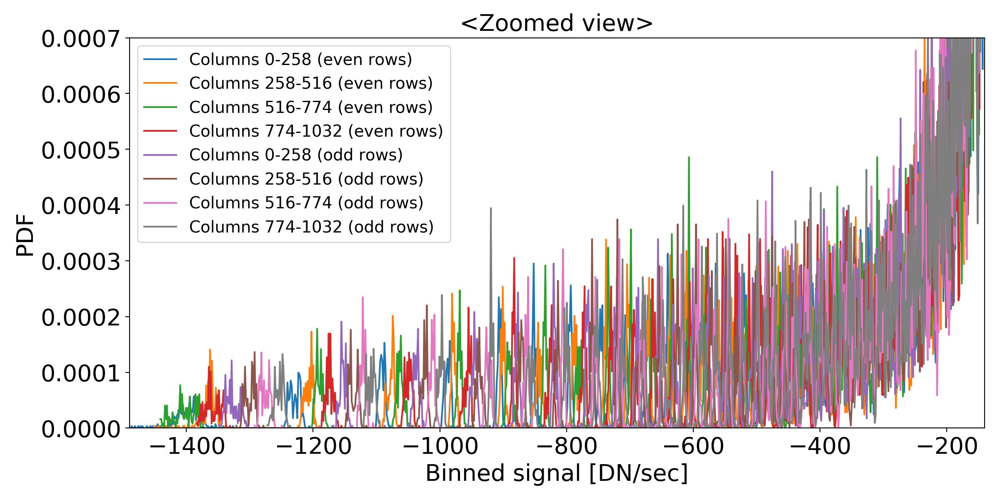

In [58]:
plt.close('all')
plt.figure(figsize=(12,6))
plt.plot(arr1_even_bincenters,arr1_even_hist,'-',label='Columns 0-258 (even rows)')
plt.plot(arr2_even_bincenters,arr2_even_hist,'-',label='Columns 258-516 (even rows)')
plt.plot(arr3_even_bincenters,arr3_even_hist,'-',label='Columns 516-774 (even rows)')
plt.plot(arr4_even_bincenters,arr4_even_hist,'-',label='Columns 774-1032 (even rows)')

plt.plot(arr1_odd_bincenters,arr1_odd_hist,'-',label='Columns 0-258 (odd rows)')
plt.plot(arr2_odd_bincenters,arr2_odd_hist,'-',label='Columns 258-516 (odd rows)')
plt.plot(arr3_odd_bincenters,arr3_odd_hist,'-',label='Columns 516-774 (odd rows)')
plt.plot(arr4_odd_bincenters,arr4_odd_hist,'-',label='Columns 774-1032 (odd rows)')
plt.legend(loc='upper left')
plt.xlabel('Binned signal [DN/sec]')
plt.ylabel('PDF')
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.title('<Zoomed view>')
plt.plot(arr1_even_bincenters,arr1_even_hist,'-',label='Columns 0-258 (even rows)')
plt.plot(arr2_even_bincenters,arr2_even_hist,'-',label='Columns 258-516 (even rows)')
plt.plot(arr3_even_bincenters,arr3_even_hist,'-',label='Columns 516-774 (even rows)')
plt.plot(arr4_even_bincenters,arr4_even_hist,'-',label='Columns 774-1032 (even rows)')

plt.plot(arr1_odd_bincenters,arr1_odd_hist,'-',label='Columns 0-258 (odd rows)')
plt.plot(arr2_odd_bincenters,arr2_odd_hist,'-',label='Columns 258-516 (odd rows)')
plt.plot(arr3_odd_bincenters,arr3_odd_hist,'-',label='Columns 516-774 (odd rows)')
plt.plot(arr4_odd_bincenters,arr4_odd_hist,'-',label='Columns 774-1032 (odd rows)')
plt.xlim(-1490,-140)
plt.ylim(0,0.0007)
plt.legend(loc='upper left')
plt.xlabel('Binned signal [DN/sec]')
plt.ylabel('PDF')
plt.tight_layout()

### GROUP 2 - GROUP 1 (detector left to right, all features)

In [11]:
img1 = bkg_exp_ramp[2,:,:258]-bkg_exp_ramp[1,:,:258]
img2 = bkg_exp_ramp[2,:,258:516]-bkg_exp_ramp[1,:,258:516]
img3 = bkg_exp_ramp[2,:,516:774]-bkg_exp_ramp[1,:,516:774]
img4 = bkg_exp_ramp[2,:,774:]-bkg_exp_ramp[1,:,774:]

# histogram
upper_lim = 100.

# even rows
arr1_even = img1[::2].flatten().copy()
arr2_even = img2[::2].flatten().copy()
arr3_even = img3[::2].flatten().copy()
arr4_even = img4[::2].flatten().copy()

arr1_even_hist,binEdges = np.histogram(arr1_even[(arr1_even<upper_lim)],bins=1000,normed=True); arr1_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr2_even_hist,binEdges = np.histogram(arr2_even[(arr2_even<upper_lim)],bins=1000,normed=True); arr2_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr3_even_hist,binEdges = np.histogram(arr3_even[(arr3_even<upper_lim)],bins=1000,normed=True); arr3_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr4_even_hist,binEdges = np.histogram(arr4_even[(arr4_even<upper_lim)],bins=1000,normed=True); arr4_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])

# odd rows
arr1_odd  = img1[1::2].flatten().copy()
arr2_odd  = img2[1::2].flatten().copy()
arr3_odd  = img3[1::2].flatten().copy()
arr4_odd  = img4[1::2].flatten().copy()

arr1_odd_hist,binEdges = np.histogram(arr1_odd[(arr1_odd<upper_lim)],bins=1000,normed=True); arr1_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr2_odd_hist,binEdges = np.histogram(arr2_odd[(arr2_odd<upper_lim)],bins=1000,normed=True); arr2_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr3_odd_hist,binEdges = np.histogram(arr3_odd[(arr3_odd<upper_lim)],bins=1000,normed=True); arr3_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr4_odd_hist,binEdges = np.histogram(arr4_odd[(arr4_odd<upper_lim)],bins=1000,normed=True); arr4_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])

<IPython.core.display.Javascript object>


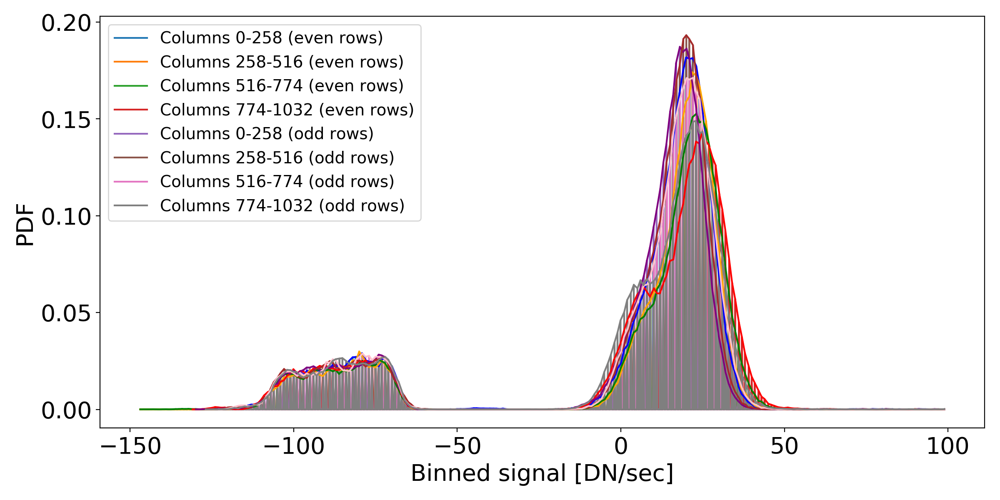

In [12]:
plt.close('all')
plt.figure(figsize=(12,6))
plt.plot(arr1_even_bincenters,arr1_even_hist,'-',label='Columns 0-258 (even rows)')
plt.plot(arr2_even_bincenters,arr2_even_hist,'-',label='Columns 258-516 (even rows)')
plt.plot(arr3_even_bincenters,arr3_even_hist,'-',label='Columns 516-774 (even rows)')
plt.plot(arr4_even_bincenters,arr4_even_hist,'-',label='Columns 774-1032 (even rows)')

plt.plot(arr1_odd_bincenters,arr1_odd_hist,'-',label='Columns 0-258 (odd rows)')
plt.plot(arr2_odd_bincenters,arr2_odd_hist,'-',label='Columns 258-516 (odd rows)')
plt.plot(arr3_odd_bincenters,arr3_odd_hist,'-',label='Columns 516-774 (odd rows)')
plt.plot(arr4_odd_bincenters,arr4_odd_hist,'-',label='Columns 774-1032 (odd rows)')

plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray')
plt.legend(loc='upper left')
plt.xlabel('Binned signal [DN/sec]')
plt.ylabel('PDF')
plt.tight_layout()

### GROUP 1 - GROUP 0 (detector left to right, right peak feature)

In [23]:
img1 = bkg_exp_ramp[1,:,:258]-bkg_exp_ramp[0,:,:258]
img2 = bkg_exp_ramp[1,:,258:516]-bkg_exp_ramp[0,:,258:516]
img3 = bkg_exp_ramp[1,:,516:774]-bkg_exp_ramp[0,:,516:774]
img4 = bkg_exp_ramp[1,:,774:]-bkg_exp_ramp[0,:,774:]

# histograms
lower_lim = -60.
upper_lim = 60.
# even rows
arr1_even = img1[::2].flatten().copy()
arr2_even = img2[::2].flatten().copy()
arr3_even = img3[::2].flatten().copy()
arr4_even = img4[::2].flatten().copy()

arr1_even_hist,binEdges = np.histogram(arr1_even[(arr1_even>lower_lim) & (arr1_even<upper_lim)],bins=1000,normed=True); arr1_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr2_even_hist,binEdges = np.histogram(arr2_even[(arr2_even>lower_lim) & (arr2_even<upper_lim)],bins=1000,normed=True); arr2_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr3_even_hist,binEdges = np.histogram(arr3_even[(arr3_even>lower_lim) & (arr3_even<upper_lim)],bins=1000,normed=True); arr3_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr4_even_hist,binEdges = np.histogram(arr4_even[(arr4_even>lower_lim) & (arr4_even<upper_lim)],bins=1000,normed=True); arr4_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])

# odd rows
arr1_odd  = img1[1::2].flatten().copy()
arr2_odd  = img2[1::2].flatten().copy()
arr3_odd  = img3[1::2].flatten().copy()
arr4_odd  = img4[1::2].flatten().copy()

arr1_odd_hist,binEdges = np.histogram(arr1_odd[(arr1_odd>lower_lim) & (arr1_odd<upper_lim)],bins=1000,normed=True); arr1_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr2_odd_hist,binEdges = np.histogram(arr2_odd[(arr2_odd>lower_lim) & (arr2_odd<upper_lim)],bins=1000,normed=True); arr2_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr3_odd_hist,binEdges = np.histogram(arr3_odd[(arr3_odd>lower_lim) & (arr3_odd<upper_lim)],bins=1000,normed=True); arr3_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr4_odd_hist,binEdges = np.histogram(arr4_odd[(arr4_odd>lower_lim) & (arr4_odd<upper_lim)],bins=1000,normed=True); arr4_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])

<IPython.core.display.Javascript object>


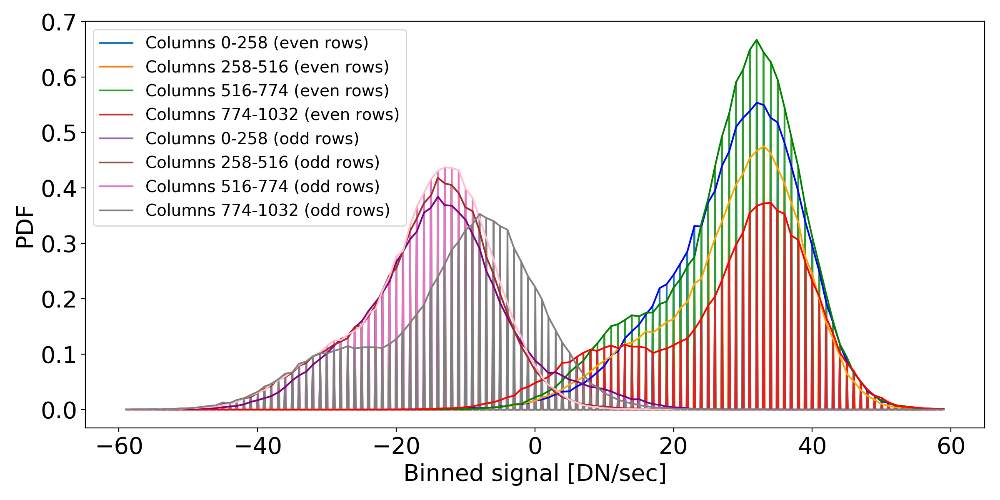

In [24]:
plt.close('all')
plt.figure(figsize=(12,6))
plt.plot(arr1_even_bincenters,arr1_even_hist,'-',label='Columns 0-258 (even rows)')
plt.plot(arr2_even_bincenters,arr2_even_hist,'-',label='Columns 258-516 (even rows)')
plt.plot(arr3_even_bincenters,arr3_even_hist,'-',label='Columns 516-774 (even rows)')
plt.plot(arr4_even_bincenters,arr4_even_hist,'-',label='Columns 774-1032 (even rows)')

plt.plot(arr1_odd_bincenters,arr1_odd_hist,'-',label='Columns 0-258 (odd rows)')
plt.plot(arr2_odd_bincenters,arr2_odd_hist,'-',label='Columns 258-516 (odd rows)')
plt.plot(arr3_odd_bincenters,arr3_odd_hist,'-',label='Columns 516-774 (odd rows)')
plt.plot(arr4_odd_bincenters,arr4_odd_hist,'-',label='Columns 774-1032 (odd rows)')

plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray')
plt.legend(loc='upper left')
plt.xlabel('Binned signal [DN/sec]')
plt.ylabel('PDF')
plt.tight_layout()

### GROUP 2 - GROUP 1 (detector left to right, right peak feature)

In [25]:
img1 = bkg_exp_ramp[2,:,:258]-bkg_exp_ramp[1,:,:258]
img2 = bkg_exp_ramp[2,:,258:516]-bkg_exp_ramp[1,:,258:516]
img3 = bkg_exp_ramp[2,:,516:774]-bkg_exp_ramp[1,:,516:774]
img4 = bkg_exp_ramp[2,:,774:]-bkg_exp_ramp[1,:,774:]

# histograms
lower_lim = -20.
upper_lim = 60.
# even rows
arr1_even = img1[::2].flatten().copy()
arr2_even = img2[::2].flatten().copy()
arr3_even = img3[::2].flatten().copy()
arr4_even = img4[::2].flatten().copy()

arr1_even_hist,binEdges = np.histogram(arr1_even[(arr1_even>lower_lim) & (arr1_even<upper_lim)],bins=1000,normed=True); arr1_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr2_even_hist,binEdges = np.histogram(arr2_even[(arr2_even>lower_lim) & (arr2_even<upper_lim)],bins=1000,normed=True); arr2_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr3_even_hist,binEdges = np.histogram(arr3_even[(arr3_even>lower_lim) & (arr3_even<upper_lim)],bins=1000,normed=True); arr3_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr4_even_hist,binEdges = np.histogram(arr4_even[(arr4_even>lower_lim) & (arr4_even<upper_lim)],bins=1000,normed=True); arr4_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])

# odd rows
arr1_odd  = img1[1::2].flatten().copy()
arr2_odd  = img2[1::2].flatten().copy()
arr3_odd  = img3[1::2].flatten().copy()
arr4_odd  = img4[1::2].flatten().copy()

arr1_odd_hist,binEdges = np.histogram(arr1_odd[(arr1_odd>lower_lim) & (arr1_odd<upper_lim)],bins=1000,normed=True); arr1_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr2_odd_hist,binEdges = np.histogram(arr2_odd[(arr2_odd>lower_lim) & (arr2_odd<upper_lim)],bins=1000,normed=True); arr2_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr3_odd_hist,binEdges = np.histogram(arr3_odd[(arr3_odd>lower_lim) & (arr3_odd<upper_lim)],bins=1000,normed=True); arr3_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr4_odd_hist,binEdges = np.histogram(arr4_odd[(arr4_odd>lower_lim) & (arr4_odd<upper_lim)],bins=1000,normed=True); arr4_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])

<IPython.core.display.Javascript object>


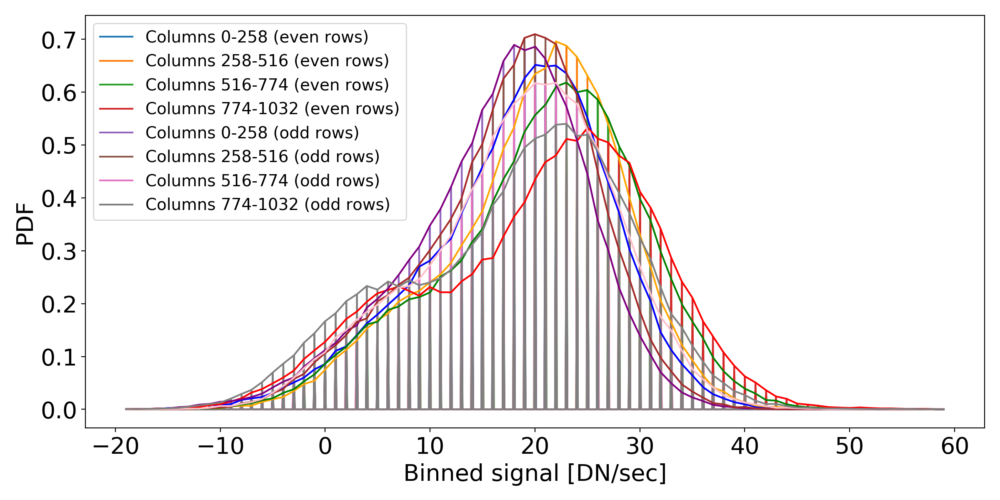

In [26]:
plt.close('all')
plt.figure(figsize=(12,6))
plt.plot(arr1_even_bincenters,arr1_even_hist,'-',label='Columns 0-258 (even rows)')
plt.plot(arr2_even_bincenters,arr2_even_hist,'-',label='Columns 258-516 (even rows)')
plt.plot(arr3_even_bincenters,arr3_even_hist,'-',label='Columns 516-774 (even rows)')
plt.plot(arr4_even_bincenters,arr4_even_hist,'-',label='Columns 774-1032 (even rows)')

plt.plot(arr1_odd_bincenters,arr1_odd_hist,'-',label='Columns 0-258 (odd rows)')
plt.plot(arr2_odd_bincenters,arr2_odd_hist,'-',label='Columns 258-516 (odd rows)')
plt.plot(arr3_odd_bincenters,arr3_odd_hist,'-',label='Columns 516-774 (odd rows)')
plt.plot(arr4_odd_bincenters,arr4_odd_hist,'-',label='Columns 774-1032 (odd rows)')

plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray')
plt.legend(loc='upper left')
plt.xlabel('Binned signal [DN/sec]')
plt.ylabel('PDF')
plt.tight_layout()

### GROUP 21 - GROUP 20 (detector left to right)

In [34]:
img1 = bkg_exp_ramp[21,:,:258]-bkg_exp_ramp[20,:,:258]
img2 = bkg_exp_ramp[21,:,258:516]-bkg_exp_ramp[20,:,258:516]
img3 = bkg_exp_ramp[21,:,516:774]-bkg_exp_ramp[20,:,516:774]
img4 = bkg_exp_ramp[21,:,774:]-bkg_exp_ramp[20,:,774:]

# histograms
lower_lim = -70.
upper_lim = 60.
# even rows
arr1_even = img1[::2].flatten().copy()
arr2_even = img2[::2].flatten().copy()
arr3_even = img3[::2].flatten().copy()
arr4_even = img4[::2].flatten().copy()

arr1_even_hist,binEdges = np.histogram(arr1_even[(arr1_even>lower_lim) & (arr1_even<upper_lim)],bins=1000,normed=True); arr1_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr2_even_hist,binEdges = np.histogram(arr2_even[(arr2_even>lower_lim) & (arr2_even<upper_lim)],bins=1000,normed=True); arr2_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr3_even_hist,binEdges = np.histogram(arr3_even[(arr3_even>lower_lim) & (arr3_even<upper_lim)],bins=1000,normed=True); arr3_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr4_even_hist,binEdges = np.histogram(arr4_even[(arr4_even>lower_lim) & (arr4_even<upper_lim)],bins=1000,normed=True); arr4_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])

# odd rows
arr1_odd  = img1[1::2].flatten().copy()
arr2_odd  = img2[1::2].flatten().copy()
arr3_odd  = img3[1::2].flatten().copy()
arr4_odd  = img4[1::2].flatten().copy()

arr1_odd_hist,binEdges = np.histogram(arr1_odd[(arr1_odd>lower_lim) & (arr1_odd<upper_lim)],bins=1000,normed=True); arr1_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr2_odd_hist,binEdges = np.histogram(arr2_odd[(arr2_odd>lower_lim) & (arr2_odd<upper_lim)],bins=1000,normed=True); arr2_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr3_odd_hist,binEdges = np.histogram(arr3_odd[(arr3_odd>lower_lim) & (arr3_odd<upper_lim)],bins=1000,normed=True); arr3_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr4_odd_hist,binEdges = np.histogram(arr4_odd[(arr4_odd>lower_lim) & (arr4_odd<upper_lim)],bins=1000,normed=True); arr4_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])

<IPython.core.display.Javascript object>


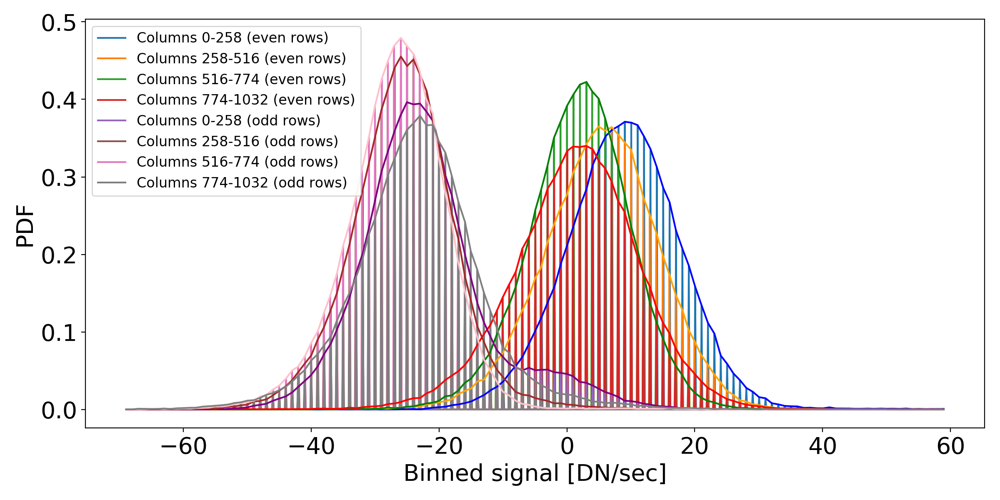

In [35]:
plt.close('all')
plt.figure(figsize=(12,6))
plt.plot(arr1_even_bincenters,arr1_even_hist,'-',label='Columns 0-258 (even rows)')
plt.plot(arr2_even_bincenters,arr2_even_hist,'-',label='Columns 258-516 (even rows)')
plt.plot(arr3_even_bincenters,arr3_even_hist,'-',label='Columns 516-774 (even rows)')
plt.plot(arr4_even_bincenters,arr4_even_hist,'-',label='Columns 774-1032 (even rows)')

plt.plot(arr1_odd_bincenters,arr1_odd_hist,'-',label='Columns 0-258 (odd rows)')
plt.plot(arr2_odd_bincenters,arr2_odd_hist,'-',label='Columns 258-516 (odd rows)')
plt.plot(arr3_odd_bincenters,arr3_odd_hist,'-',label='Columns 516-774 (odd rows)')
plt.plot(arr4_odd_bincenters,arr4_odd_hist,'-',label='Columns 774-1032 (odd rows)')

plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray')
plt.legend(loc='upper left',fontsize=12)
plt.xlabel('Binned signal [DN/sec]')
plt.ylabel('PDF')
plt.tight_layout()

### GROUP 22 - GROUP 21 (detector left to right)

In [38]:
img1 = bkg_exp_ramp[22,:,:258]-bkg_exp_ramp[21,:,:258]
img2 = bkg_exp_ramp[22,:,258:516]-bkg_exp_ramp[21,:,258:516]
img3 = bkg_exp_ramp[22,:,516:774]-bkg_exp_ramp[21,:,516:774]
img4 = bkg_exp_ramp[22,:,774:]-bkg_exp_ramp[21,:,774:]

# histograms
lower_lim = -20.
upper_lim = 60.
# even rows
arr1_even = img1[::2].flatten().copy()
arr2_even = img2[::2].flatten().copy()
arr3_even = img3[::2].flatten().copy()
arr4_even = img4[::2].flatten().copy()

arr1_even_hist,binEdges = np.histogram(arr1_even[(arr1_even>lower_lim) & (arr1_even<upper_lim)],bins=1000,normed=True); arr1_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr2_even_hist,binEdges = np.histogram(arr2_even[(arr2_even>lower_lim) & (arr2_even<upper_lim)],bins=1000,normed=True); arr2_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr3_even_hist,binEdges = np.histogram(arr3_even[(arr3_even>lower_lim) & (arr3_even<upper_lim)],bins=1000,normed=True); arr3_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr4_even_hist,binEdges = np.histogram(arr4_even[(arr4_even>lower_lim) & (arr4_even<upper_lim)],bins=1000,normed=True); arr4_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])

# odd rows
arr1_odd  = img1[1::2].flatten().copy()
arr2_odd  = img2[1::2].flatten().copy()
arr3_odd  = img3[1::2].flatten().copy()
arr4_odd  = img4[1::2].flatten().copy()

arr1_odd_hist,binEdges = np.histogram(arr1_odd[(arr1_odd>lower_lim) & (arr1_odd<upper_lim)],bins=1000,normed=True); arr1_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr2_odd_hist,binEdges = np.histogram(arr2_odd[(arr2_odd>lower_lim) & (arr2_odd<upper_lim)],bins=1000,normed=True); arr2_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr3_odd_hist,binEdges = np.histogram(arr3_odd[(arr3_odd>lower_lim) & (arr3_odd<upper_lim)],bins=1000,normed=True); arr3_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
arr4_odd_hist,binEdges = np.histogram(arr4_odd[(arr4_odd>lower_lim) & (arr4_odd<upper_lim)],bins=1000,normed=True); arr4_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])

<IPython.core.display.Javascript object>


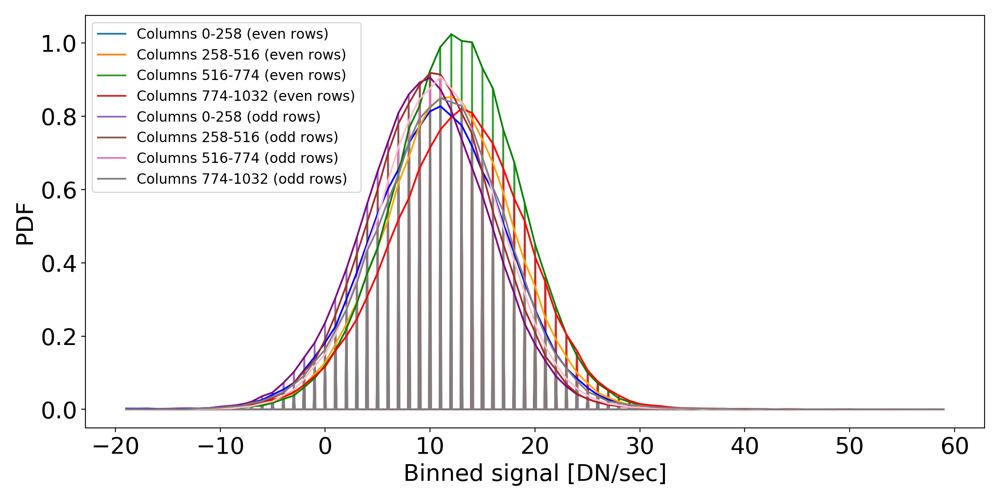

In [39]:
plt.close('all')
plt.figure(figsize=(12,6))
plt.plot(arr1_even_bincenters,arr1_even_hist,'-',label='Columns 0-258 (even rows)')
plt.plot(arr2_even_bincenters,arr2_even_hist,'-',label='Columns 258-516 (even rows)')
plt.plot(arr3_even_bincenters,arr3_even_hist,'-',label='Columns 516-774 (even rows)')
plt.plot(arr4_even_bincenters,arr4_even_hist,'-',label='Columns 774-1032 (even rows)')

plt.plot(arr1_odd_bincenters,arr1_odd_hist,'-',label='Columns 0-258 (odd rows)')
plt.plot(arr2_odd_bincenters,arr2_odd_hist,'-',label='Columns 258-516 (odd rows)')
plt.plot(arr3_odd_bincenters,arr3_odd_hist,'-',label='Columns 516-774 (odd rows)')
plt.plot(arr4_odd_bincenters,arr4_odd_hist,'-',label='Columns 774-1032 (odd rows)')

plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray')
plt.legend(loc='upper left',fontsize=12)
plt.xlabel('Binned signal [DN/sec]')
plt.ylabel('PDF')
plt.tight_layout()